### Import Libraries

If a library is not installed use pip to do so. e.g. create a new code cell block in the notebook and type 'pip install plotly' (without the quotes) and run.

In [ ]:
pip install plotly

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import seaborn as sns
import matplotlib.tri as mtri
import plotly.graph_objects as go
sns.set_style('whitegrid')

In [2]:
ls

Interpolation_boundary_nodes.py  sp22_bpm15_v3_3rdinf4.csv
Plot-Error-Distribution_1.py     sp22_bpm15_v3_ref.csv
Untitled.ipynb                   sp22_bpm20_v3_3rdinf3.csv
sp22_bpm10_v3_3rdinf6.csv        sp22_bpm20_v3_ref.csv
sp22_bpm10_v3_ref.csv


### Import the two different conditions

Comparing coordinates across two conditions. Since focused on initial coordinates of points before infation subtract the appropriate dimension by its displacement.

In [3]:
bpm15 = pd.read_csv('sp22_bpm15_v3_3rdinf4.csv')
bpm15.dropna(inplace=True)
bpm15['x'] = bpm15['x'] - bpm15['displacement_x']
bpm15['y'] = bpm15['y'] - bpm15['displacement_y']
bpm15['z'] = bpm15['z'] - bpm15['displacement_z']
display(bpm15)

,id,x,y,z,displacement_x,displacement_y,displacement_z,major_strain
1,23,-39.2271,59.7857,-24.3291,-5.1065,5.2757,12.7112,54.7436
2,24,-38.3645,58.9890,-23.9363,-4.9591,5.0551,13.0029,55.2981
3,25,-37.4662,58.1801,-23.6420,-4.8828,4.8170,13.2974,62.2547
4,26,-36.6363,57.3309,-23.4045,-4.7784,4.5752,13.6316,67.3883
5,27,-35.8052,56.4924,-23.0975,-4.7044,4.3140,14.0098,66.6473
...,...,...,...,...,...,...,...,...
23752,1174,39.3547,-139.4031,-66.7048,-0.6360,-2.2401,-0.3593,6.9278
23753,1175,40.8072,-139.6331,-66.6888,-0.5398,-2.2086,-0.2385,6.7558
23754,1176,42.3288,-140.0333,-66.8759,-0.4115,-2.1422,-0.1481,6.9916
23755,1177,43.8520,-140.4191,-67.0571,-0.2776,-2.0708,-0.0640,6.6339


In [4]:
bpm20 = pd.read_csv('sp22_bpm20_v3_3rdinf3.csv')
bpm20.dropna(inplace=True)
bpm20['x'] = bpm20['x'] - bpm20['displacement_x']
bpm20['y'] = bpm20['y'] - bpm20['displacement_y']
bpm20['z'] = bpm20['z'] - bpm20['displacement_z']
display(bpm20)

,id,x,y,z,displacement_x,displacement_y,displacement_z,major_strain
12,13,-48.1807,70.8626,-33.6767,-5.7070,4.0035,8.0792,26.1947
13,14,-47.8905,69.4230,-31.9792,-5.8397,3.8295,8.3247,19.5032
14,15,-47.7147,67.9108,-30.6345,-5.8190,3.7708,8.5791,17.4336
15,16,-47.4596,66.4156,-29.3724,-5.8178,3.7194,8.8987,37.0920
16,17,-46.7442,65.1294,-28.4095,-5.7675,3.8677,9.9083,40.1944
...,...,...,...,...,...,...,...,...
26100,2981,-25.7037,68.3986,-24.5743,-4.2604,6.3904,10.6781,25.1593
26101,2982,-24.7526,68.3776,-24.2313,-4.1575,6.5527,10.7303,24.3882
26102,2983,-23.8042,68.3660,-23.8895,-4.0549,6.7326,10.8339,30.9835
26103,2984,-22.8603,68.4122,-23.5312,-3.9124,6.9233,10.7956,35.1616


### Observe if the two conditions share the same coordinate space.

Necessary to know if they share the same space, so the interpolation is reasonable for the different coordinates. 

In [5]:
fig = go.Figure(data=[go.Scatter3d(x = bpm15['x'].values, y = bpm15['y'].values,
               z = bpm15['z'].values, mode='markers',
                marker=
                    dict(size=2, opacity=0.2), name = 'BPM15')
                  ])

fig.add_trace(go.Scatter3d(x = bpm20['x'].values, y = bpm20['y'].values,
               z = bpm20['z'].values, mode='markers',
                marker=
                    dict(size=2, opacity=0.2), name = 'BPM20')
                  )

fig.update_layout(scene_aspectmode='cube', margin=dict(l=20, r=20, t=20, b=20),
                 title=" Overlay of BPM15 and BPM20",
                 font=dict(
        family="Courier New, monospace",
        size=15,
        color="RebeccaPurple"
    ))
fig.show()

### Train, Test Split and fit data unto KNN Regressor.

Since the coordinates are not exact to compare each other, predict what the major_strain will be from one condition by using the second conition's coordinates - do this via regression. The regressor of choice is K-Nearest Neighbors - it finds the n-closest points from data already learned and averages the 5 closest points to determine the major strain prediction. I guessssss you can call this machine learning if you want clout. :)

Import the KNeighborsRegressor. The input data (X) is the coordinates of the first condition, the output data (Y) is the prediction based on the input data. Split data into training and testing sets, you do this so the model does not overfit your data. You want to ensure that the model will make really good predictions to new instances of input data. 

Fit the training data to the model. This will allow the model to learn to make predictions based on the training data.



In [6]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor

X_train, X_test, y_train, y_test = train_test_split(
                            bpm15[['x', 'y', 'z']].values,
                            bpm15['major_strain'].values,
                            test_size=0.20, random_state=0)
KNN_R = KNeighborsRegressor(n_neighbors = 5)

KNN_R.fit(X_train, y_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')

### Quick Model Evaulation
For an R^2 of above 90 % for train and test sets for over 20,000 data points is very promising. R^2 = 1 - u/v = the % of variation that is described by the model. 1.0 being the best possibility.

The min and max of major_strain is -17.6185 and 675.7994, respectively, and the mean and median is 26 and 28. A total RMSE of a little less than 7 is pretty promising, especially given that it's not that far off from the training sets RMSE.

In [7]:
from sklearn.metrics import mean_squared_error, r2_score, make_scorer

def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def cv_rmse_scores(title, scores):
    scores = np.sqrt(-scores)
    print(title, 'scores:', scores)
    print('Mean:', np.mean(scores))
    print('Standard Deviation:', np.std(scores), 
        '\n----------------------------------------------------------------\n')

    return np.mean(scores), np.std(scores)

def R2(y_true,y_pred):
    return r2_score(y_true, y_pred)

def Grid_scorer():
    return make_scorer(R2, greater_is_better=True) # change for false if using RMSE


R^2 (train, test): [0.9043041856806882, 0.9003334964429265]
RMSE (train, test): [6.780664988435752, 6.705698986601548] 

(Train) Cross-Validated RMSE scores: [10.13697602  6.25497366 11.93081147  6.18100215  6.10762261  8.6771
  5.68332304  7.5453725   7.66981211 12.19266102]
Mean: 8.23796545819427
Standard Deviation: 2.3044783646285043 
----------------------------------------------------------------



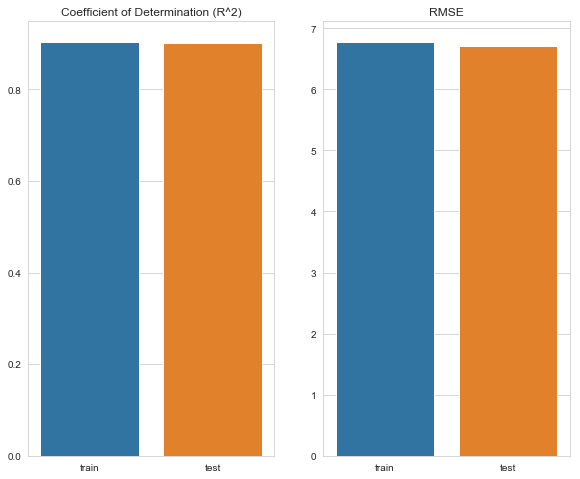

In [8]:
dataset = ['train', 'test']
accuracy = [KNN_R.score(X_train, y_train), KNN_R.score(X_test, y_test)]
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
sns.barplot(dataset, accuracy)
plt.title('Coefficient of Determination (R^2)')

rmse_list = [rmse(y_train, KNN_R.predict(X_train)), 
       rmse(y_test, KNN_R.predict(X_test))]

plt.subplot(1, 2, 2)
sns.barplot(dataset, rmse_list)
plt.title('RMSE')


print('R^2 (train, test):', accuracy)
print('RMSE (train, test):', rmse_list, '\n')

cvMean, cvSTD = cv_rmse_scores('(Train) Cross-Validated RMSE', 
                                cross_val_score(KNN_R, 
                                X_train,
                                y_train,
                                scoring = "neg_mean_squared_error", 
                                cv = 10))


plt.show()

Print the true values and predicted values side by side just in case to quality check. Take out indexing for all predictions.

In [15]:
for true, pred in zip(y_test[:50], KNN_R.predict(X_test)[:50]):
    print(true, pred)

66.8836 62.5615
1.4477 2.07222
42.548 39.21742
72.8286 71.1154
27.9403 28.58984
36.6204 40.27808
78.1918 74.30096
16.8143 18.20514
34.9942 34.79766
27.9385 28.29282
52.88 45.12931999999999
33.1004 33.307579999999994
22.2794 23.2554
1.9013 1.84924
57.6248 61.475300000000004
30.9074 35.15222
26.5916 44.15598
44.7245 45.714800000000004
64.2092 64.67644
64.217 59.37270000000001
26.9499 36.1913
49.2806 50.582679999999996
27.9513 25.895680000000006
15.5509 16.09402
6.7519 12.698620000000002
68.1888 71.81523999999999
9.0127 7.627160000000001
3.0448 3.21718
1.2977 2.5695799999999998
45.8463 45.84104
20.5698 21.870359999999998
54.4502 62.99456
43.8851 40.937380000000005
24.6154 30.4147
31.8291 32.51438
60.8367 66.00234
1.0417 1.15408
28.7032 30.37808
33.5287 25.673019999999998
25.049 22.162920000000003
41.6234 40.12008
24.2814 27.5135
31.5247 32.26456
28.598 26.36124
17.2128 16.953200000000002
102.3643 56.36762000000001
2.2414 1.2944
27.2357 18.52574
20.9987 21.214660000000002
14.5186 20.01632


### Hyperparameter Tuning. 
n_neighbors = 5 produces best mean 10-fold R^2 cross-validation. Adjust previous cell based on this.

In [10]:
def hyperparam_tuning(model, params, X, Y):
    grid_search_cv = GridSearchCV(model, param_grid = params, cv=10, 
                          scoring = Grid_scorer())
    grid_search_cv.fit(X, Y)
    print('Best Parameter:', grid_search_cv.best_params_) 
    cv_res =  grid_search_cv.cv_results_

    for mean_score, params in zip(cv_res['mean_test_score'], cv_res['params']):
#         print(np.sqrt(-mean_score), params)
        print(mean_score, params)
    
    
        
    return grid_search_cv.best_estimator_

    

hyperparam_tuning(KNN_R, {'n_neighbors':[1, 2, 3, 4, 5, 10, 20, 50]}, 
                  X_train, y_train)

Best Parameter: {'n_neighbors': 5}
0.6423105496618089 {'n_neighbors': 1}
0.8020433816877789 {'n_neighbors': 2}
0.8383643436313029 {'n_neighbors': 3}
0.842615306601558 {'n_neighbors': 4}
0.8557691008616356 {'n_neighbors': 5}
0.8201109025934294 {'n_neighbors': 10}
0.7741330638464 {'n_neighbors': 20}
0.7186987756958737 {'n_neighbors': 50}


KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')


### RMSE of input and label identity shuffling with 95 % CI. 
If falls within 95 % interval that means our model is not truly regressing properly. If it falls outside the interval, we can be even more confident that the model is truly regressing beyond chance. If it were to fall within the confidence interval, the model is regressing to a certain range of values regardless of coordinate inputs.

95% confidence interval: [28.34675631 29.15345576]


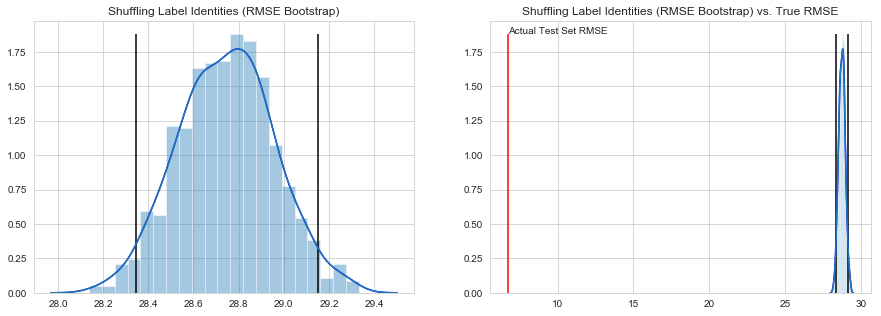

In [11]:
def plot_bootstap_rmse(y_test_orig, y_pred, title, iterations = 1000):
    bootstrap_rmse = []
    for i in range(iterations):
        y_test = y_test_orig.copy()
        np.random.shuffle(y_test)
        bootstrap_rmse.append(rmse(y_test, y_pred))

    confidence_values = np.percentile(np.array(bootstrap_rmse), [2.5, 97.5])
    print('95% confidence interval:', confidence_values)
    
    plt.figure(figsize=(15, 5))
    plt.subplot(1,2,1)
    sns.distplot(bootstrap_rmse, hist = False, color = 'b')
    max_height = np.max([h.get_height() for h in sns.distplot(bootstrap_rmse).patches])
    plt.vlines(confidence_values, ymin = 0, ymax = max_height) 
    plt.title(title)
    
    plt.subplot(1,2,2)
    sns.distplot(bootstrap_rmse, hist = False, color = 'b')
    max_height = np.max([h.get_height() for h in sns.distplot(bootstrap_rmse).patches])
    plt.vlines(confidence_values, ymin = 0, ymax = max_height) 
    plt.vlines(rmse(y_test_orig, y_pred), ymin = 0, ymax = max_height, colors='red')
    plt.text(rmse(y_test_orig, y_pred), max_height, 'Actual Test Set RMSE')
    plt.title(title + ' vs. True RMSE')
    

plot_bootstap_rmse(y_test, KNN_R.predict(X_test), 
                   'Shuffling Label Identities (RMSE Bootstrap)')

plt.show()

### Obtain Major Strain values for BPM15 using BPM20 coordinates

In [12]:
bpm15_major_20coord = KNN_R.predict(bpm20[['x', 'y', 'z']].values)

### Plot Results

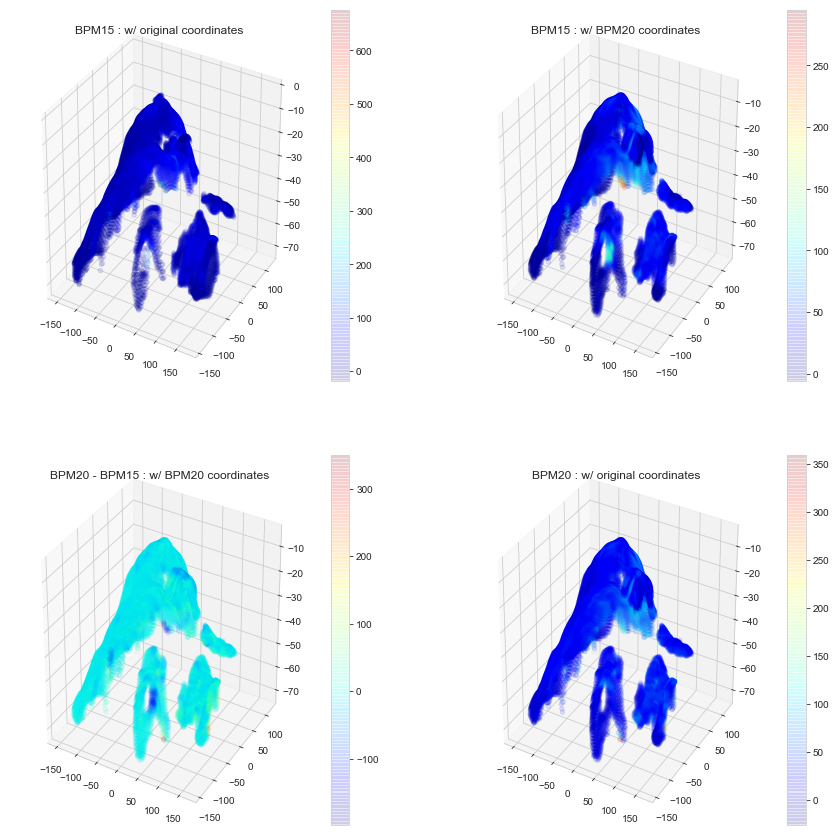

In [13]:
fig = plt.figure(figsize=(15, 15))

ax = fig.add_subplot(2, 2, 1, projection='3d')
plot1 = ax.scatter(bpm15['x'].values, 
           bpm15['y'].values, 
           bpm15['z'].values, 
           c = bpm15['major_strain'],
           cmap = plt.cm.jet,
           alpha = 0.1)
fig.colorbar(plot1)
plt.title('BPM15 : w/ original coordinates')

ax2 = fig.add_subplot(2, 2, 2, projection='3d')
plot2 = ax2.scatter(bpm20['x'].values, 
           bpm20['y'].values, 
           bpm20['z'].values, 
           c = bpm15_major_20coord,
           cmap = plt.cm.jet,
           alpha = 0.1)
fig.colorbar(plot2)
plt.title('BPM15 : w/ BPM20 coordinates')

ax3 = fig.add_subplot(2, 2, 3, projection='3d')
plot3 = ax3.scatter(bpm20['x'].values, 
           bpm20['y'].values, 
           bpm20['z'].values, 
           c = bpm20['major_strain'] - bpm15_major_20coord,
           cmap = plt.cm.jet,
           alpha = 0.1)
fig.colorbar(plot3)
plt.title('BPM20 - BPM15 : w/ BPM20 coordinates')

ax4 = fig.add_subplot(2, 2, 4, projection='3d')
plot4 = ax4.scatter(bpm20['x'].values, 
           bpm20['y'].values, 
           bpm20['z'].values, 
           c = bpm20['major_strain'],
           cmap = plt.cm.jet,
           alpha = 0.1)
fig.colorbar(plot4)
plt.title('BPM20 : w/ original coordinates')

plt.show()

### BPM20 - BPM15  in respect to BPM20 coordinates

In [14]:
fig = go.Figure(data=[go.Scatter3d(x = bpm20['x'].values, y = bpm20['y'].values,
               z = bpm20['z'].values, mode='markers',
                marker=
                    dict(size=2, color = bpm20['major_strain'] - bpm15_major_20coord, 
                colorscale='jet', opacity=0.2, colorbar=dict(thickness=20)))
                  ])
fig.update_layout(scene_aspectmode='cube', margin=dict(l=20, r=20, t=20, b=20),
                 title="BPM20 - BPM15 : w/ BPM20 coordinates",
                 font=dict(
        family="Courier New, monospace",
        size=15,
        color="RebeccaPurple"
    ))
fig.show()